In [1]:
# pip install dask

In [5]:
import dask.dataframe as dd

# Load the CSV files using Dask
sales_df = dd.read_csv(r"C:\Users\syama\Desktop\DataSpark_Illumination\Sales.csv", encoding='ISO-8859-1')
stores_df = dd.read_csv(r"C:\Users\syama\Desktop\DataSpark_Illumination\Stores.csv", encoding='ISO-8859-1',dtype={'SquareMeters': 'float64'})
products_df = dd.read_csv(r"C:\Users\syama\Desktop\DataSpark_Illumination\Products.csv", encoding='ISO-8859-1')
customers_df = dd.read_csv(r"C:\Users\syama\Desktop\DataSpark_Illumination\Customers (1).csv", encoding='ISO-8859-1', dtype={'ZipCode': 'object'})

# Merge the datasets
merged_df_part1 = sales_df.merge(stores_df, on='StoreKey', how='left')
merged_df_part1 = merged_df_part1.merge(products_df, on='ProductKey', how='left')
merged_df_part1 = merged_df_part1.merge(customers_df, on='CustomerKey', how='left')

# Save Part 1 to CSV
merged_df_part1.to_csv('Merged_Data_Part1_dask.csv', single_file=True)


print("Merging completed and saved as 'Merged_Data_Part1_dask.csv'")


Merging completed and saved as 'Merged_Data_Part1_dask.csv'


In [7]:
merged_df_part1

,OrderNumber,LineItem,OrderDate,DeliveryDate,CustomerKey,StoreKey,ProductKey,Quantity,CurrencyCode,Country_x,State_x,SquareMeters,OpenDate,ProductName,Brand,Color,UnitCostUSD,UnitPriceUSD,SubcategoryKey,Subcategory,CategoryKey,Category,Gender,Name,City,StateCode,State_y,ZipCode,Country_y,Continent,Birthday
npartitions=1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,int64,int64,string,string,int64,int64,int64,int64,string,string,string,float64,string,string,string,string,string,string,int64,string,int64,string,string,string,string,string,string,string,string,string,string
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


In [10]:
import pandas as pd

# Load the CSV files using pandas
merged_part1_df = pd.read_csv(r"C:\Users\syama\Desktop\DataSpark_Illumination\Merged_Data_Part1_dask.csv", encoding='ISO-8859-1', dtype={'CurrencyCode': 'category'})
exchange_rates_df = pd.read_csv(r"C:\Users\syama\Desktop\DataSpark_Illumination\Exchange_Rates.csv", encoding='ISO-8859-1', dtype={'Currency': 'category'})

# Extract only the 'Currency Code' column from the merged_part1_df
merged_currency_df = merged_part1_df[['CurrencyCode']]

# Merge with exchange_rates_df based on the 'Currency Code' from merged_currency_df and 'Currency' from exchange_rates_df
final_merged_df = pd.merge(merged_currency_df, exchange_rates_df, left_on='CurrencyCode', right_on='Currency', how='left')

# Display the merged result (optional, to view the first few rows)
print(final_merged_df.head())

# Save the merged result into smaller parts by saving partitions to separate CSV files
final_merged_df.to_csv('Final_Merged_Data_spark.csv')

print("Final merging completed and saved into multiple parts.")

  CurrencyCode      Date Currency  Exchange
0          CAD  1/1/2015      CAD    1.1583
1          CAD  1/2/2015      CAD    1.1682
2          CAD  1/3/2015      CAD    1.1682
3          CAD  1/4/2015      CAD    1.1682
4          CAD  1/5/2015      CAD    1.1784
Final merging completed and saved into multiple parts.


In [12]:
# Check again for null values to confirm the change
# null_values_after = data[['Customer_Birthday']].isnull().sum()
# print(null_values_after)

In [14]:
# Load the data
file_path =  r"C:\Users\syama\Desktop\DataSpark_Illumination\Merged_Data_Part1_dask.csv"
data = pd.read_csv(file_path)

In [15]:
data.columns

Index(['Unnamed: 0', 'OrderNumber', 'LineItem', 'OrderDate', 'DeliveryDate',
       'CustomerKey', 'StoreKey', 'ProductKey', 'Quantity', 'CurrencyCode',
       'Country_x', 'State_x', 'SquareMeters', 'OpenDate', 'ProductName',
       'Brand', 'Color', 'UnitCostUSD', 'UnitPriceUSD', 'SubcategoryKey',
       'Subcategory', 'CategoryKey', 'Category', 'Gender', 'Name', 'City',
       'StateCode', 'State_y', 'ZipCode', 'Country_y', 'Continent',
       'Birthday'],
      dtype='object')

In [72]:
import pandas as pd
from datetime import datetime


# Load the data
file_path =  r"C:\Users\syama\Desktop\DataSpark_Illumination\Merged_Data_Part1_dask.csv"
data = pd.read_csv(file_path)

# 1. Drop unnecessary index column
if 'Unnamed: 0' in data.columns:
    data = data.drop(columns=['Unnamed: 0'])

# Convert relevant columns to datetime format with errors='coerce' to handle invalid values
data['OrderDate'] = pd.to_datetime(data['OrderDate'], errors='coerce')
data['DeliveryDate'] = pd.to_datetime(data['DeliveryDate'], errors='coerce')
data['Birthday'] = pd.to_datetime(data['Birthday'], errors='coerce')

# Get the current date and time (without .date() to retain time)
current_datetime = datetime.now()

# Fill missing or invalid date values with the current date and time
data['DeliveryDate'] = data['DeliveryDate'].fillna(current_datetime)
data['OrderDate'] = data['OrderDate'].fillna(current_datetime)
data['Birthday'] = data['Birthday'].fillna(current_datetime)

# 5. Drop duplicates based on 'Order Number' and 'Line Item'
data = data.drop_duplicates(subset=['OrderNumber', 'LineItem'])

# 6. Fill missing values in important customer-related fields
data['City'] = data['City'].fillna('Unknown')
data['StateCode'] = data['StateCode'].fillna('Unknown')

# 7. Handle missing or invalid values in the 'Quantity' column
data['Quantity'] = data['Quantity'].fillna(0)

# 8. Standardize continent names by title-casing them
data['Continent'] = data['Continent'].str.title()

# 9. Clean up 'Customer_Gender' values (if necessary, adjust for consistent values)
data['Gender'] = data['Gender'].replace({'M': 'Male', 'F': 'Female'})

# Check for any remaining missing values and provide summary
missing_data_summary = data.isnull().sum()

# Display cleaned data summary and missing data count
print(missing_data_summary)

# Optional: Save the cleaned data to a new CSV file
data.to_csv( r"C:\Users\syama\Desktop\DataSpark_Illumination\Cleaned_Merged_Data.csv", index=False)


OrderNumber           0
LineItem              0
OrderDate             0
DeliveryDate          0
CustomerKey           0
StoreKey              0
ProductKey            0
Quantity              0
CurrencyCode          0
Country_x             0
State_x               0
SquareMeters      13165
OpenDate              0
ProductName           0
Brand                 0
Color                 0
UnitCostUSD           0
UnitPriceUSD          0
SubcategoryKey        0
Subcategory           0
CategoryKey           0
Category              0
Gender                0
Name                  0
City                  0
StateCode             0
State_y               0
ZipCode               0
Country_y             0
Continent             0
Birthday              0
dtype: int64


PermissionError: [Errno 13] Permission denied: 'C:\\Users\\syama\\Desktop\\DataSpark_Illumination\\Cleaned_Merged_Data.csv'

In [76]:
import pandas as pd

# Load the data
file_path = r"C:\Users\syama\Desktop\DataSpark_Illumination\Cleaned_Merged_Data.csv"
data = pd.read_csv(file_path)

data['Open Date'].unique()

array(['04-04-2015', '01-01-2010', '12-09-2015', '01-01-2015',
       '01-01-2008', '03-04-2005', '01-01-2014', '01-01-2012',
       '06-07-2013', '03-06-2008', '06-06-2012', '08-08-2012',
       '06-03-2010', '12/15/2012', '01-07-2012', '12/15/2009',
       '01-12-2008', '07-02-2014', '08-08-2008', '07-08-2007',
       '06-03-2009', '06-03-2018', '03-05-2019'], dtype=object)

In [73]:
import pandas as pd
import re


# Define the regex pattern for MM/DD/YYYY format
mmddyyyy_pattern = re.compile(r'^(0[1-9]|1[0-2])\/(0[1-9]|[12][0-9]|3[01])\/\d{4}$')

# Function to convert MM/DD/YYYY to DD-MM-YYYY
def convert_mmddyyyy_to_ddmmyyyy(date_str):
    return pd.to_datetime(date_str, format='%m/%d/%Y').strftime('%d-%m-%Y')


In [86]:
# Function to convert dates from multiple formats
def convert_to_yyyy_mm_dd(date_str):
    for fmt in ('%d-%m-%Y', '%m/%d/%Y'):  # Define the formats you expect
        try:
            return datetime.strptime(date_str, fmt).strftime('%Y-%m-%d')
        except ValueError:
            pass
    return None  # Return None if no format matches

In [49]:
import pandas as pd

# Load the data
file_path = r"C:\Users\syama\Desktop\DataSpark_Illumination\Cleaned_Merged_Data.csv"
data = pd.read_csv(file_path)

# Convert 'Order Date' and 'Delivery Date' to datetime while handling errors
data['Order Date'] = pd.to_datetime(data['Order Date'], errors='coerce')
data['Delivery Date'] = pd.to_datetime(data['Delivery Date'], errors='coerce')
data['Customer_Birthday'] = pd.to_datetime(data['Customer_Birthday'], errors='coerce')
data['Open Date']=pd.to_datetime(data['Open Date'], errors='coerce')
# Apply the function to check and convert only rows that are strings and match MM/DD/YYYY
#data['Open Date'] = data['Open Date'].apply(lambda x: convert_mmddyyyy_to_ddmmyyyy(x) if isinstance(x, str) and mmddyyyy_pattern.match(x) else x)

# Reformat these dates to the format 'YYYY-MM-DD'
# Convert the 'Customer_Birthday' column to datetime in YYYY-MM-DD format
data['Order Date'] = pd.to_datetime(data['Order Date'], format='%d-%m-%Y')
data['Delivery Date'] = pd.to_datetime(data['Delivery Date'], format='%d-%m-%Y')
data['Customer_Birthday'] = pd.to_datetime(data['Customer_Birthday'], format='%d-%m-%Y')
# data['Open Date'] = pd.to_datetime(data['Open Date'], format='%d-%m-%Y')

# Remove the time component entirely by using .dt.date (this ensures only the date is stored)
data['Order Date'] = data['Order Date'].dt.date
data['Delivery Date'] = data['Delivery Date'].dt.date
data['Customer_Birthday'] = data['Customer_Birthday'].dt.date
# data['Open Date'] = data['Open Date'].dt.date

data['Unit Cost USD'] = data['Unit Cost USD'].astype(str).str.strip().replace({r'\$': '', ',': ''}, regex=True).astype(float)
data['Unit Price USD'] = data['Unit Price USD'].astype(str).str.strip().replace({r'\$': '', ',': ''}, regex=True).astype(float)

# # Convert the 'Open Date' column to datetime using infer_datetime_format=True
# df['Open Date'] = pd.to_datetime(df['Open Date'], infer_datetime_format=True, errors='coerce')

# Convert the 'Open Date' column to datetime with DD-MM-YYYY format and then format it to YYYY-MM-DD
data['Open Date'] = pd.to_datetime(data['Open Date'], format='%d-%m-%Y').dt.strftime('%Y-%m-%d')


# # Convert all dates to the format YYYY-MM-DD
# df['Open Date'] = df['Open Date'].dt.strftime('%Y-%m-%d')
# Apply the conversion function to the 'Open Date' column
# df['Open Date'] = df['Open Date'].apply(convert_to_yyyy_mm_dd)
# Save the updated data to a new CSV file
data.to_csv(r"C:\Users\syama\Desktop\DataSpark_Illumination\Cleanedsemifinal_Data.csv", index=False)

# Optionally, display the first few rows to confirm the changes
print(data[['Order Date', 'Delivery Date', 'Customer_Birthday','Open Date' ]].head())

   Order Date Delivery Date Customer_Birthday   Open Date
0  2016-01-01    2024-09-17        1971-03-23  2015-04-04
1  2016-01-01    2016-01-13        1995-11-20  2010-01-01
2  2016-01-01    2016-01-13        1995-11-20  2010-01-01
3  2016-01-01    2024-09-17        1962-08-24  2010-01-01
4  2016-01-01    2024-09-17        1962-08-24  2010-01-01


In [43]:
data['Open Date'].unique()

array(['2015-04-04', '2010-01-01', '2015-12-09', '2015-01-01',
       '2008-01-01', '2005-03-04', '2014-01-01', '2012-01-01',
       '2013-06-07', '2008-03-06', '2012-06-06', '2012-08-08',
       '2010-06-03', nan, '2012-01-07', '2008-01-12', '2014-07-02',
       '2008-08-08', '2007-07-08', '2009-06-03', '2018-06-03',
       '2019-03-05'], dtype=object)

In [44]:
# Get basic statistics
square_meters_stats = data['Square Meters'].describe()
print(square_meters_stats)


count    49719.000000
mean      1594.442869
std        461.800495
min        245.000000
25%       1260.000000
50%       1715.000000
75%       2000.000000
max       2105.000000
Name: Square Meters, dtype: float64


In [45]:
# Fill with mean

data1= pd.read_csv(r"C:\Users\syama\Desktop\DataSpark_Illumination\Cleanedsemifinal_Data.csv")
mean_filled_data = data1.copy()
mean_filled_data['Square Meters'] = mean_filled_data['Square Meters'].fillna(mean_filled_data['Square Meters'].mean())

# Fill with median
median_filled_data = data1.copy()
median_filled_data['Square Meters'] = median_filled_data['Square Meters'].fillna(median_filled_data['Square Meters'].median())

# Fill with 0 (or any specific value)
zero_filled_data = data1.copy()
zero_filled_data['Square Meters'] = zero_filled_data['Square Meters'].fillna(0)

# Compare summaries
print("Mean-filled data:")
print(mean_filled_data['Square Meters'].describe())
print("\nMedian-filled data:")
print(median_filled_data['Square Meters'].describe())
print("\nZero-filled data:")
print(zero_filled_data['Square Meters'].describe())



Mean-filled data:
count    62884.000000
mean      1594.442869
std        410.624249
min        245.000000
25%       1300.000000
50%       1594.442869
75%       2000.000000
max       2105.000000
Name: Square Meters, dtype: float64

Median-filled data:
count    62884.000000
mean      1619.681954
std        413.543290
min        245.000000
25%       1300.000000
50%       1715.000000
75%       2000.000000
max       2105.000000
Name: Square Meters, dtype: float64

Zero-filled data:
count    62884.000000
mean      1260.640306
std        767.739494
min          0.000000
25%        840.000000
50%       1330.000000
75%       2000.000000
max       2105.000000
Name: Square Meters, dtype: float64


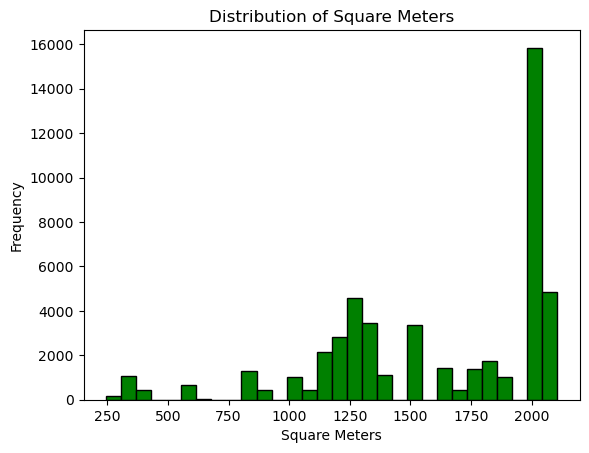

In [46]:
import matplotlib.pyplot as plt

# Plot the distribution
plt.hist(data1['Square Meters'].dropna(), bins=30, color='green', edgecolor='black')
plt.title('Distribution of Square Meters')
plt.xlabel('Square Meters')
plt.ylabel('Frequency')
plt.show()


The median fills the data with a higher central tendency compared to the mean, indicating it better represents the central store size.
The standard deviation is higher than the mean-filled method, reflecting more natural variability.
Since the median is less affected by outliers, it might offer a more realistic estimate for filling missing values in store sizes, especially if your data has extreme values (as indicated by the max of 2105 and the min of 245).

In [47]:
# Fill null values in 'Square Meters' with the median

data1= pd.read_csv(r"C:\Users\syama\Desktop\DataSpark_Illumination\Cleanedsemifinal_Data.csv")
median_square_meters = data1['Square Meters'].median()
data['Square Meters'] = data1['Square Meters'].fillna(median_square_meters)

# Save the updated data to a new CSV file
data1.to_csv(r"C:\Users\syama\Desktop\DataSpark_Illumination\Updated_Square_Meters_Filled_With_Median.csv", index=False)

# Display the updated summary
print(data['Square Meters'].describe())


count    62884.000000
mean      1619.681954
std        413.543290
min        245.000000
25%       1300.000000
50%       1715.000000
75%       2000.000000
max       2105.000000
Name: Square Meters, dtype: float64


In [48]:
import pandas as pd

# Load the CSV file
file_path = r"C:\Users\syama\Desktop\DataSpark_Illumination\Cleanedsemifinal_Data.csv" # Replace with your actual file path
data = pd.read_csv(file_path)

# Check if 'Square Meters' column exists
if 'Square Meters' in data.columns:
    # Calculate the median of the 'Square Meters' column
    median_value = data['Square Meters'].median()
    
    # Fill missing values with the median value without using inplace=True
    data['Square Meters'] = data['Square Meters'].fillna(median_value)
    
    # Save the updated DataFrame to a new CSV file
    output_path =r"C:\Users\syama\Desktop\DataSpark_Illumination\Updated_Square_Meters_Filled_With_Median.csv" # Replace with your desired output file path
    data.to_csv(output_path, index=False)
    
    print("Missing values filled and saved successfully.")
else:
    print("Column 'Square Meters' not found in the dataset.")


Missing values filled and saved successfully.


In [102]:
null_values=data.isnull().sum()
null_values

Order Number           0
Line Item              0
Order Date             0
Delivery Date          0
CustomerKey            0
StoreKey               0
ProductKey             0
Quantity               0
Currency Code          0
Country_Store          0
State_Store            0
Square Meters          0
Open Date              0
Product Name           0
Brand                  0
Color                  0
Unit Cost USD          0
Unit Price USD         0
SubcategoryKey         0
Subcategory            0
CategoryKey            0
Category               0
Customer_Gender        0
Customer_Name          0
Customer_City          0
Customer_State Code    0
Customer_State         0
Zip Code_Customer      0
Customer_Country       0
Customer_Continent     0
Customer_Birthday      0
dtype: int64

In [103]:
# ! pip install mysql-connector-python

In [104]:
import mysql.connector

# Establish a connection
connection = mysql.connector.connect(
    host='localhost',      # Database host, e.g., 'localhost'
    user='root',      # Database username
    password='Syamala@9666',
    port=3306,                 # Database port, usually 3306 for MySQL
)

# Create a cursor object to interact with the database
cursor = connection.cursor()


In [105]:
# Query to create the database only if it doesn't exist
create_database_query = "CREATE DATABASE IF NOT EXISTS GlobalDataSpark_Illumination"

# Execute the query
cursor.execute(create_database_query)

# Optionally, you can commit the changes (if required by your database system)
connection.commit()

print("Database created or already exists.")


Database created or already exists.


In [107]:
import mysql.connector  # Replace this with the correct DB connector if using another DB

# Establish a connection to the database
connection=mysql.connector.connect(
    host='localhost',
    user='root',
    password='Syamala@9666',
    database='GlobalDataSpark_Illumination',
    port='3306'
)

# Create the cursor before executing the query
cursor = connection.cursor()# Define the SQL query to create the table
create_table_query = """
CREATE TABLE IF NOT EXISTS Orders (
    Order_Number VARCHAR(255),
    Line_Item INT,
    Order_Date DATE,
    Delivery_Date DATE,
    CustomerKey INT,
    StoreKey INT,
    ProductKey INT,
    Quantity INT,
    Currency_Code VARCHAR(10),
    Country_Store VARCHAR(100),
    State_Store VARCHAR(100),
    Square_Meters FLOAT,
    Open_Date DATE,
    Product_Name VARCHAR(255),
    Brand VARCHAR(255),
    Color VARCHAR(100),
    Unit_Cost_USD DECIMAL(10, 2),
    Unit_Price_USD DECIMAL(10, 2),
    SubcategoryKey INT,
    Subcategory VARCHAR(255),
    CategoryKey INT,
    Category VARCHAR(255),
    Customer_Gender VARCHAR(10),
    Customer_Name VARCHAR(255),
    Customer_City VARCHAR(255),
    Customer_State_Code VARCHAR(10),
    Customer_State VARCHAR(255),
    Zip_Code_Customer VARCHAR(10),
    Customer_Country VARCHAR(255),
    Customer_Continent VARCHAR(255),
    Customer_Birthday DATE
);
"""

# Execute the query to create the table
cursor.execute(create_table_query)

# Commit the transaction to make the changes persistent
connection.commit()

# Close the cursor and connection
cursor.close()
connection.close()


In [ ]:
import pandas as pd
import mysql.connector

# Step 1: Load the CSV file into a pandas DataFrame
csv_file_path = r"C:\Users\syama\Desktop\DataSpark_Illumination\Updated_Square_Meters_Filled_With_Median.csv"  # Replace with the actual path of your CSV file
df = pd.read_csv(csv_file_path)

# Step 2: Establish a connection to your MySQL database
connection = mysql.connector.connect(
    host='localhost',            # Replace with your host
    user='root',        # Replace with your MySQL username
    password='Syamala@9666',    # Replace with your MySQL password
    database='GlobalDataSpark_Illumination',    # Replace with your MySQL database name
    port='3306'
)
cursor=connection.cursor()
# Commit the transaction to make the changes persistent
connection.commit()

# Step 4: Prepare the SQL query to insert data into your table
insert_query = """
INSERT INTO Orders (
    Order_Number, Line_Item, Order_Date, Delivery_Date, CustomerKey, StoreKey,
    ProductKey, Quantity, Currency_Code, Country_Store, State_Store, Square_Meters,
    Open_Date, Product_Name, Brand, Color, Unit_Cost_USD, Unit_Price_USD,
    SubcategoryKey, Subcategory, CategoryKey, Category, Customer_Gender, Customer_Name,
    Customer_City, Customer_State_Code, Customer_State, Zip_Code_Customer,
    Customer_Country, Customer_Continent, Customer_Birthday
) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
"""

# Step 5: Iterate over each row in the DataFrame and insert it into the database
for index, row in df.iterrows():
    # Safely access each column with .get() to handle missing values
    data_tuple = (
        row.get('Order Number', None), row.get('Line Item', None), row.get('Order Date', None),
        row.get('Delivery Date', None), row.get('CustomerKey', None), row.get('StoreKey', None),
        row.get('ProductKey', None), row.get('Quantity', None), row.get('Currency Code', None),
        row.get('Country_Store', None), row.get('State_Store', None), row.get('Square Meters', None),
        row.get('Open Date', None), row.get('Product Name', None), row.get('Brand', None),
        row.get('Color', None), row.get('Unit Cost USD', None), row.get('Unit Price USD', None),
        row.get('SubcategoryKey', None), row.get('Subcategory', None), row.get('CategoryKey', None),
        row.get('Category', None), row.get('Customer_Gender', None), row.get('Customer_Name', None),
        row.get('Customer_City', None), row.get('Customer_State_Code', None), row.get('Customer_State', None),
        row.get('Zip Code_Customer', None), row.get('Customer_Country', None),
        row.get('Customer_Continent', None), row.get('Customer_Birthday', None)
    )
    
    # Debugging print statement to check if the number of placeholders matches the data length
    print(f"Expected placeholders: {insert_query.count('%s')}, Provided data: {len(data_tuple)}")
    print(f"Inserting row {index}: {data_tuple}")
    
    # Execute the insert query with the data from the row
    cursor.execute(insert_query, data_tuple)

# Step 6: Commit the transaction to the database
connection.commit()

# Step 7: Close the cursor and the connection
cursor.close()
connection.close()

print("Data has been loaded successfully.")


Expected placeholders: 31, Provided data: 31
Inserting row 0: (366000, 1, '2016-01-01 00:00:00.000000', '2024-09-17', 265598, 10, 1304, 1, 'CAD', 'Canada', 'Nunavut', 1210.0, '2015-04-04', 'Contoso Lens Adapter M450 White', 'Contoso', 'White', 31.27, 68.0, 406, 'Cameras & Camcorders Accessories', 4, 'Cameras and camcorders', 'Male', 'Tyler Vaught', 'London', None, 'Ontario', 'N5W 5K6', 'Canada', 'North America', '1971-03-23')
Expected placeholders: 31, Provided data: 31
Inserting row 1: (366001, 1, '2016-01-01 00:00:00.000000', '2016-01-13', 1269051, 0, 1048, 2, 'USD', 'Online', 'Online', 1715.0, '2010-01-01', 'A. Datum SLR Camera X136 Silver', 'A. Datum', 'Silver', 141.47, 427.0, 402, 'Digital SLR Cameras', 4, 'Cameras and camcorders', 'Male', 'Frank Upchurch', 'Auberry', None, 'California', '93602', 'United States', 'North America', '1995-11-20')
Expected placeholders: 31, Provided data: 31
Inserting row 2: (366001, 2, '2016-01-01 00:00:00.000000', '2016-01-13', 1269051, 0, 2007, 1, 

In [141]:
import pandas as pd

# Load the CSV file
df = pd.read_csv(r"C:\Users\syama\Desktop\DataSpark_Illumination\Customers_utf8.csv")

# Convert the 'Birthday' column to datetime, letting pandas infer the format
df['Birthday'] = pd.to_datetime(df['Birthday'], errors='coerce')

# Format the 'Birthday' column to YYYY-MM-DD
df['Birthday'] = pd.to_datetime(df['Birthday'], format='%d-%m-%Y')

# Get the current date and time (without .date() to retain time)
current_datetime = datetime.now()

df['Birthday'] = df['Birthday'].fillna(current_datetime)
df['Birthday'] = df['Birthday'].dt.date

# Display the first few rows to check the result
print(df.head())

output_file= r"C:\Users\syama\Desktop\DataSpark_Illumination\Customer_clean.csv"
df.to_csv(output_file, index=False)

   CustomerKey  Gender               Name            City StateCode  \
0          301  Female      Lilly Harding  WANDEARAH EAST        SA   
1          325  Female       Madison Hull      MOUNT BUDD        WA   
2          554  Female      Claire Ferres       WINJALLOK       VIC   
3          786    Male  Jai Poltpalingada    MIDDLE RIVER        SA   
4         1042    Male    Aidan Pankhurst   TAWONGA SOUTH       VIC   

               State ZipCode    Country  Continent    Birthday  
0    South Australia    5523  Australia  Australia  1939-07-03  
1  Western Australia    6522  Australia  Australia  2024-09-17  
2           Victoria    3380  Australia  Australia  2024-09-17  
3    South Australia    5223  Australia  Australia  2024-09-17  
4           Victoria    3698  Australia  Australia  2024-09-17  


In [129]:
# Identify rows with invalid dates
invalid_dates = df[df['Birthday'].isna()]
print(invalid_dates)

Empty DataFrame
Columns: [CustomerKey, Gender, Name, City, StateCode, State, ZipCode, Country, Continent, Birthday]
Index: []


In [131]:
import mysql.connector  # Replace this with the correct DB connector if using another DB

# Establish a connection to the database
connection=mysql.connector.connect(
    host='localhost',
    user='root',
    password='Syamala@9666',
    database='GlobalDataSpark_Illumination',
    port='3306'
)

create_customers_table="""CREATE TABLE IF NOT EXISTS Customers (
    CustomerKey INT,
    Gender VARCHAR(10),
    Name VARCHAR(255),
    City VARCHAR(255),
    StateCode VARCHAR(5),
    State VARCHAR(255),
    ZipCode VARCHAR(10),
    Country VARCHAR(100),
    Continent VARCHAR(100),
    Birthday DATE
);
"""

# Execute the SQL query to create the table
cursor= connection.cursor()
cursor.execute(create_customers_table)

# Commit changes
connection.commit()
print("Table 'Customers' created successfully.")

Table 'Customers' created successfully.


In [142]:
import pandas as pd

# Load the CSV file
df = pd.read_csv(r"C:\Users\syama\Desktop\DataSpark_Illumination\Stores.csv")

# Convert the 'Birthday' column to datetime, letting pandas infer the format
df['Open_Date'] = pd.to_datetime(df['Open_Date'], errors='coerce')

# Format the 'Birthday' column to YYYY-MM-DD
df['Open_Date'] = pd.to_datetime(df['Open_Date'], format='%d-%m-%Y')

# Get the current date and time (without .date() to retain time)
current_datetime = datetime.now()

df['Open_Date'] = df['Open_Date'].fillna(current_datetime)
df['Open_Date'] = df['Open_Date'].dt.date

# Display the first few rows to check the result
print(df.head())

output_file= r"C:\Users\syama\Desktop\DataSpark_Illumination\Stores_clean.csv"
df.to_csv(output_file, index=False)

   StoreKey    Country                         State  Square_Meters  \
0         1  Australia  Australian Capital Territory          595.0   
1         2  Australia            Northern Territory          665.0   
2         3  Australia               South Australia         2000.0   
3         4  Australia                      Tasmania         2000.0   
4         5  Australia                      Victoria         2000.0   

    Open_Date  
0  2008-01-01  
1  2008-01-12  
2  2012-01-07  
3  2010-01-01  
4  2015-12-09  


In [133]:
# Define the SQL query to create the Stores table
create_stores_table = """
CREATE TABLE IF NOT EXISTS Stores (
    StoreKey INT,
    Country VARCHAR(255),
    State VARCHAR(255),
    Square_Meters INT,
    Open_Date DATE
    -- Add other columns as necessary
);
"""

# Execute the SQL query to create the table
cursor= connection.cursor()
cursor.execute(create_stores_table)

# Commit changes
connection.commit()

print("Table 'Stores' created successfully.")


Table 'Stores' created successfully.


In [27]:
import pandas as pd

# Load the data
file_path = r"C:\Users\syama\Desktop\DataSpark_Illumination\Sales.csv"
data = pd.read_csv(file_path)

# Convert 'Order Date' and 'Delivery Date' to datetime while handling errors
data['Order_Date'] = pd.to_datetime(data['Order_Date'], errors='coerce')
data['Delivery_Date'] = pd.to_datetime(data['Delivery_Date'], errors='coerce')


# Reformat these dates to the format 'YYYY-MM-DD'
# Convert the 'Customer_Birthday' column to datetime in YYYY-MM-DD format
data['Order_Date'] = pd.to_datetime(data['Order_Date'], format='%d-%m-%Y')
data['Delivery_Date'] = pd.to_datetime(data['Delivery_Date'], format='%d-%m-%Y')

# Get the current date and time (without .date() to retain time)
current_datetime = datetime.now()

# Fill missing or invalid date values with the current date and time
data['Delivery_Date'] = data['Delivery_Date'].fillna(current_datetime)
data['Order_Date'] = data['Order_Date'].fillna(current_datetime)


output_file= r"C:\Users\syama\Desktop\DataSpark_Illumination\Sales_clean.csv"
data.to_csv(output_file, index=False)

In [33]:
import mysql.connector  # Replace this with the correct DB connector if using another DB

# Establish a connection to the database
connection=mysql.connector.connect(
    host='localhost',
    user='root',
    password='Syamala@9666',
    database='GlobalDataSpark_Illumination',
    port='3306'
)


In [34]:

# Define the SQL query to create the Stores table
create_sales_table = """
CREATE TABLE IF NOT EXISTS Sales (
                Order_Number INT,
                Line_Item	INT,
                Order_Date	DATE,
                Delivery_Date DATE,	
                CustomerKey	INT,
                StoreKey	INT,
                ProductKey	INT,
                Quantity	INT,
                Currency_Code VARCHAR(255)
);
"""

# Execute the SQL query to create the table
cursor= connection.cursor()
cursor.execute(create_sales_table)

# Commit changes
connection.commit()
print("Table 'Sales' created successfully.")

Table 'Sales' created successfully.


In [1]:
import pandas as pd

# Load the data
file_path = r"C:\Users\syama\Desktop\DataSpark_Illumination\Products.csv"
data = pd.read_csv(file_path)
data['UnitCostUSD'] = data['UnitCostUSD'].astype(str).str.strip().replace({r'\$': '', ',': ''}, regex=True).astype(float)
data['UnitPriceUSD'] = data['UnitPriceUSD'].astype(str).str.strip().replace({r'\$': '', ',': ''}, regex=True).astype(float)

output_file= r"C:\Users\syama\Desktop\DataSpark_Illumination\Products_clean.csv"
data.to_csv(output_file, index=False)

In [4]:

# Define the SQL query to create the Stores table
create_products_table = """
CREATE TABLE IF NOT EXISTS Products (
                ProductKey  INT,
                ProductName VARCHAR(255),
                Brand	VARCHAR(255),
                Color	VARCHAR(255),
                UnitCostUSD FLOAT,	
                UnitPriceUSD	FLOAT,
                Subcategory	INT,
                SubcategoryKey VARCHAR(255),
                CategoryKey	INT,
                Category VARCHAR(255)
);
"""

# Execute the SQL query to create the table
cursor= connection.cursor()
cursor.execute(create_products_table)

# Commit changes
connection.commit()
print("Table 'Products' created successfully.")

Table 'Products' created successfully.


In [145]:
create_exchangerates_table="""CREATE TABLE IF NOT EXISTS Exchangerates (
    Date  DATE,
    Currency  VARCHAR(100),
    Exchange  VARCHAR(100)

);
"""

# Execute the SQL query to create the table
cursor= connection.cursor()
cursor.execute(create_exchangerates_table)

# Commit changes
connection.commit()
print("Table 'exchangerates' created successfully.")

Table 'exchangerates' created successfully.


In [153]:
import mysql.connector

# Establish MySQL connection
connection = mysql.connector.connect(
    host='localhost',      
    user='root',           
    password='Syamala@9666',
    database='GlobalDataSpark_Illumination',  
    port=3306,   
    allow_local_infile=True  
)

cursor = connection.cursor()


# Step 2: Reload cleaned data using LOAD DATA LOCAL INFILE
load_data_query = """
LOAD DATA LOCAL INFILE 'C:/Users/syama/Desktop/DataSpark_Illumination/Stores_clean.csv'
INTO TABLE Stores
FIELDS TERMINATED BY ',' 
ENCLOSED BY '"'
LINES TERMINATED BY '\n'
IGNORE 1 ROWS
(StoreKey, Country, State, Square_Meters, Open_Date);
"""
cursor.execute(load_data_query)

# Commit changes and close the connection
connection.commit()
cursor.close()
connection.close()

print("Loaded cleaned data successfully.")


Loaded cleaned data successfully.


In [154]:
import mysql.connector
connection=mysql.connector.connect(
            host='localhost',
            user='root',
            password='Syamala@9666',
            database='GlobalDataSpark_Illumination',  
            port=3306,   
            allow_local_infile=True  
)

cursor=connection.cursor()

load_data_query="""
LOAD DATA LOCAL INFILE 'C:/Users/syama/Desktop/DataSpark_Illumination/Customer_clean.csv'
INTO TABLE Customers
FIELDS TERMINATED BY ','
ENCLOSED BY '"'
LINES TERMINATED BY '\n'
IGNORE 1 ROWS
()
"""

cursor.execute(load_data_query)

# Commit changes and close the connection
connection.commit()
cursor.close()
connection.close()

print("Loaded cleaned data successfully.")

Loaded cleaned data successfully.


In [35]:
import mysql.connector
connection=mysql.connector.connect(
            host='localhost',
            user='root',
            password='Syamala@9666',
            database='GlobalDataSpark_Illumination',  
            port=3306,   
            allow_local_infile=True  
)

cursor=connection.cursor()

load_data_query="""
LOAD DATA LOCAL INFILE "C:/Users/syama/Desktop/DataSpark_Illumination/Sales_clean.csv"
INTO TABLE Sales
FIELDS TERMINATED BY ','
ENCLOSED BY '"'
LINES TERMINATED BY '\n'
IGNORE 1 ROWS
(Order_Number, Line_Item, Order_Date, Delivery_Date,  CustomerKey, StoreKey, ProductKey, Quantity, Currency_Code);
"""

cursor.execute(load_data_query)

# Commit changes and close the connection
connection.commit()
cursor.close()
connection.close()

print("Loaded cleaned data successfully.")

Loaded cleaned data successfully.


In [5]:
import mysql.connector
connection=mysql.connector.connect(
            host='localhost',
            user='root',
            password='Syamala@9666',
            database='GlobalDataSpark_Illumination',  
            port=3306,   
            allow_local_infile=True  
)

cursor=connection.cursor()

load_data_query="""
LOAD DATA LOCAL INFILE "C:/Users/syama/Desktop/DataSpark_Illumination/Products_clean.csv"
INTO TABLE Products
FIELDS TERMINATED BY ','
ENCLOSED BY '"'
LINES TERMINATED BY '\n'
IGNORE 1 ROWS
()
"""

cursor.execute(load_data_query)

# Commit changes and close the connection
connection.commit()
cursor.close()
connection.close()

print("Loaded cleaned data successfully.")

Loaded cleaned data successfully.


In [158]:
import mysql.connector
connection=mysql.connector.connect(
            host='localhost',
            user='root',
            password='Syamala@9666',
            database='GlobalDataSpark_Illumination',  
            port=3306,   
            allow_local_infile=True  
)

cursor=connection.cursor()

load_data_query="""
LOAD DATA LOCAL INFILE "C:/Users/syama/Desktop/DataSpark_Illumination/Exchange_Rates.csv"
INTO TABLE exchangerates
FIELDS TERMINATED BY ','
ENCLOSED BY '"'
LINES TERMINATED BY '\n'
IGNORE 1 ROWS
()
"""

cursor.execute(load_data_query)

# Commit changes and close the connection
connection.commit()
cursor.close()
connection.close()

print("Loaded cleaned data successfully.")

Loaded cleaned data successfully.
